# Exploratory Data Analysis

----

# Import Libraries:

In [1]:
from pyspark.sql import SparkSession
from pyspark.sql import functions as F 
from pyspark.sql.functions import * 
from shapely import wkt
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import pandas as pd
import numpy as np
import folium
import os

In [2]:
# Create a spark session (which will run spark jobs)
spark = (
    SparkSession.builder.appName("eda")
    .config("spark.sql.repl.eagerEval.enabled", True)
    .config("spark.network.timeout", "600s")
    .config("spark.driver.maxResultSize", "2g")
    .config("spark.rpc.askTimeout", "600s")
    .config("spark.driver.memory", "100G")
    .config("spark.executor.memory", "100G")
    .config("spark.sql.parquet.cacheMetadata", "true")
    .config("spark.sql.session.timeZone", "Etc/UTC")
    .config("spark.sql.debug.maxToStringFields", "1000")
    .getOrCreate()
)

24/08/25 16:49:00 WARN Utils: Your hostname, Cocos-MacBook-Air.local resolves to a loopback address: 127.0.0.1; using 172.16.33.67 instead (on interface en0)
24/08/25 16:49:00 WARN Utils: Set SPARK_LOCAL_IP if you need to bind to another address
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
24/08/25 16:49:00 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


# Read Files:

In [3]:
base_dir = "../data"
plot_path = '../plots'

### Full HVFHV Dataset:

In [24]:
hvfhv_path = base_dir + '/developed/merged_data/full_hvfhv'
hvfhv_sdf = spark.read.parquet(hvfhv_path)
hvfhv_sdf.show(5)

+-----------------+------------+------------+----------+---------+-------------------+-----+----+---------+--------------------+-----------+----+----------+-------------------+-----------------+----------------+--------------+-----------+-------------------------+-------------------+-----------------+------------------+-----------+-----------+------------+------------+-----+
|hvfhs_license_num|PULocationID|DOLocationID|trip_miles|trip_time|base_passenger_fare|tolls| bcf|sales_tax|congestion_surcharge|airport_fee|tips|driver_pay|shared_request_flag|shared_match_flag|wav_request_flag|wav_match_flag|day_of_week|request_to_pickup_minutes|         trip_speed|total_fare_amount|     total_revenue|pickup_date|pickup_hour|dropoff_date|dropoff_hour|month|
+-----------------+------------+------------+----------+---------+-------------------+-----+----+---------+--------------------+-----------+----+----------+-------------------+-----------------+----------------+--------------+-----------+------

### Demand Related Datasets:

Hourly demand dataset:

In [25]:
hourly_demand_path = base_dir + '/developed/merged_data/hourly_pickup_demand'
hourly_demand = spark.read.parquet(hourly_demand_path)
hourly_demand_df = hourly_demand.toPandas()
hourly_demand_df.head()

,pickup_hour,pickup_date,day_type,mean_hourly_demand
0,0,2023-08-20,Weekend,1401.166667
1,0,2023-08-19,Weekend,1261.625000
2,0,2023-08-27,Weekend,1409.833333
3,0,2023-08-26,Weekend,1221.041667
4,0,2023-08-25,Weekday,698.250000


Hourly demand among day of week dataset:

In [26]:
hourly_demand_among_day_of_week_path = base_dir + '/developed/merged_data/hourly_demand_among_day_of_week'
hourly_demand_among_day_of_week = spark.read.parquet(hourly_demand_among_day_of_week_path)
hourly_demand_among_day_of_week_df = hourly_demand_among_day_of_week.toPandas()
hourly_demand_among_day_of_week_df.head()

,pickup_date,day_of_week,day_type,pickup_hour,day_by_hour_demand
0,2023-08-25,Friday,Weekday,12,985.166667
1,2023-08-18,Friday,Weekday,23,1487.083333
2,2023-08-25,Friday,Weekday,20,1307.708333
3,2023-08-25,Friday,Weekday,23,1408.666667
4,2023-08-18,Friday,Weekday,18,1400.958333


Daily pickup demand by location ID dataset:

In [27]:
daily_pickup_demand_by_location_path = base_dir + '/developed/merged_data/daily_pickup_demand_by_location.csv'
daily_pickup_demand_by_location_df = pd.read_csv(daily_pickup_demand_by_location_path)
daily_pickup_demand_by_location_df.head()

,location_id,daily_demand
0,138,10761.804348
1,132,10112.038043
2,79,7616.304348
3,61,7402.119565
4,230,6427.972826


Daily dropoff demand by location ID dataset:

In [28]:
daily_dropoff_demand_by_location_path = base_dir + '/developed/merged_data/daily_dropoff_demand_by_location.csv'
daily_dropoff_demand_by_location_df = pd.read_csv(daily_dropoff_demand_by_location_path)
daily_dropoff_demand_by_location_df.head()

,location_id,daily_demand
0,132,15080.815217
1,138,13835.298913
2,61,7743.902174
3,68,6500.304348
4,79,6363.163043


Daily pickup demand by pickup date dataset:

In [29]:
daily_demand_path = base_dir + '/developed/merged_data/daily_pickup_demand'
daily_demand = spark.read.parquet(daily_demand_path)
daily_demand.show(5)

+-----------+------------+--------------------+
|pickup_date|PULocationID|        daily_demand|
+-----------+------------+--------------------+
| 2023-07-01|           2|0.016304347826086956|
| 2023-07-01|           3|   6.190217391304348|
| 2023-07-01|           4|  12.043478260869565|
| 2023-07-01|           5|  0.9836956521739131|
| 2023-07-01|           6|   1.815217391304348|
+-----------+------------+--------------------+
only showing top 5 rows



Daily pickup demand by different building class dataset:

In [30]:
demand_by_building_class_path = base_dir + '/developed/merged_data/daily_demand_by_building_class_df.csv'
demand_by_building_class_df = pd.read_csv(demand_by_building_class_path)
demand_by_building_class_df.head()

,building_class,daily_demand
0,B,5.171086e+08
1,A,4.298425e+08
2,C,3.926477e+08
3,S,9.472546e+07
4,D,4.750691e+07


Monthly pickup demand dataset:

In [31]:
month_path = base_dir + '/developed/merged_data/monthly_pickup_demand'
monthly_demand = spark.read.parquet(month_path)
monthly_demand_df = monthly_demand.toPandas()
monthly_demand_df.head()

,month,monthly_demand
0,7,2.748802e+06
1,8,2.640568e+06
2,9,2.835555e+06
3,10,2.895856e+06
4,11,2.752378e+06


### Revenue Related Datasets:

Hourly Revenue:

In [5]:
hourly_revenue_path = base_dir + '/developed/merged_data/hourly_revenue'
hourly_revenue = spark.read.parquet(hourly_revenue_path)
hourly_revenue_df = hourly_revenue.toPandas()
hourly_revenue_df.head()

,pickup_hour,pickup_date,day_type,mean_hourly_revenue
0,0,2023-08-20,Weekend,27160.790417
1,0,2023-08-19,Weekend,24378.106250
2,0,2023-08-27,Weekend,28295.611250
3,0,2023-08-26,Weekend,23362.556250
4,0,2023-08-25,Weekday,12720.395417


Hourly revenue among day of week dataset:

In [6]:
hourly_revenue_among_day_of_week_path = base_dir + '/developed/merged_data/hourly_revenue_among_day_of_week'
hourly_revenue_among_day_of_week = spark.read.parquet(hourly_revenue_among_day_of_week_path)
hourly_revenue_among_day_of_week_df = hourly_revenue_among_day_of_week.toPandas()
hourly_revenue_among_day_of_week_df.head()

,pickup_date,day_of_week,day_type,pickup_hour,day_by_hour_revenue
0,2023-08-25,Friday,Weekday,12,20932.065000
1,2023-08-18,Friday,Weekday,23,28939.363333
2,2023-08-25,Friday,Weekday,20,24169.993333
3,2023-08-25,Friday,Weekday,23,26070.494167
4,2023-08-18,Friday,Weekday,18,28010.772917


Daily revenue by location ID dataset:

In [7]:
daily_revenue_by_location_df_path = base_dir + '/developed/merged_data/daily_revenue_by_location_df.csv'
daily_revenue_by_location_df = pd.read_csv(daily_revenue_by_location_df_path)
daily_revenue_by_location_df.head()

,location_id,daily_revenue
0,132,490265.603750
1,138,400708.996413
2,230,182360.321467
3,161,163863.122609
4,79,156364.447935


Daily revenue by pickup date dataset:

In [8]:
daily_revenue_path = base_dir + '/developed/merged_data/daily_revenue'
daily_revenue = spark.read.parquet(daily_revenue_path)
daily_revenue.show(5)

+-----------+------------+-------------------+
|pickup_date|PULocationID|      daily_revenue|
+-----------+------------+-------------------+
| 2023-07-01|           2|0.24369565217391306|
| 2023-07-01|           3|  102.3845652173913|
| 2023-07-01|           4|  230.4214130434783|
| 2023-07-01|           5|  19.35326086956521|
| 2023-07-01|           6|  34.76135869565217|
+-----------+------------+-------------------+
only showing top 5 rows



Monthly revenue dataset:

In [9]:
month_path = base_dir + '/developed/merged_data/monthly_revenue'
monthly_revenue = spark.read.parquet(month_path)
monthly_revenue_df = monthly_revenue.toPandas()
monthly_revenue_df.head()

,month,monthly_revenue
0,7,5.544857e+07
1,8,5.356570e+07
2,9,6.280313e+07
3,10,6.233148e+07
4,11,5.813193e+07


### Utilization Rate Dataset:

In [5]:
utilization_rate_path = base_dir + '/developed/merged_data/utilization_rate'
utilization_rate = spark.read.parquet(utilization_rate_path)
utilization_rate_df = utilization_rate.toPandas()
utilization_rate_df.head()

,pickup_hour,hvfhs_license_num,avg_utilization_rate
0,0,0,0.758154
1,0,1,0.747008
2,1,0,0.759125
3,1,1,0.755614
4,2,0,0.751812


### Geographic Zone Dataset:

In [11]:
zone_gdf_path = base_dir + '/developed/merged_data/zone_gdf.csv'
zone_gdf = pd.read_csv(zone_gdf_path)
zone_gdf['geometry'] = zone_gdf['geometry'].apply(wkt.loads)
zone_gdf.head()

,location_id,service_zone,Shape_Leng,Shape_Area,zone,borough,geometry
0,1,EWR,0.116357,0.000782,Newark Airport,EWR,POLYGON ((-74.18445299999996 40.69499600000009...
1,2,Boro Zone,0.433470,0.004866,Jamaica Bay,Queens,MULTIPOLYGON (((-73.82337597260663 40.63898704...
2,3,Boro Zone,0.084341,0.000314,Allerton/Pelham Gardens,Bronx,"POLYGON ((-73.84792614099985 40.8713422340001,..."
3,4,Yellow Zone,0.043567,0.000112,Alphabet City,Manhattan,POLYGON ((-73.97177410965318 40.72582128133726...
4,5,Boro Zone,0.092146,0.000498,Arden Heights,Staten Island,POLYGON ((-74.17421738099989 40.56256808600009...


### PLUTO Related Datasets:

In [10]:
pluto_df_path = base_dir + '/developed/merged_data/pluto_df.csv'
pluto_df = pd.read_csv(pluto_df_path)
pluto_df.head()

,building_class,geometry,location_id,service_zone,zone,borough
0,F,POINT (-74.0750604 40.6288711),221,Boro Zone,Stapleton,Staten Island
1,B,POINT (-74.0746779 40.6154356),221,Boro Zone,Stapleton,Staten Island
2,B,POINT (-74.074487 40.6155098),221,Boro Zone,Stapleton,Staten Island
3,B,POINT (-74.0745662 40.6154741),221,Boro Zone,Stapleton,Staten Island
4,B,POINT (-74.0750307 40.6152734),221,Boro Zone,Stapleton,Staten Island


### Weather Related Datasets:

In [40]:
weather_path = base_dir + '/developed/merged_data/hourly_demand_by_weather'
hourly_demand_by_weather = spark.read.parquet(weather_path)
hourly_demand_by_weather_df = hourly_demand_by_weather.toPandas()
hourly_demand_by_weather_df.head()

,hour,avg_hourly_demand,DateOnly,AvgHourlyTemp,AvgHourlyPrecipitation,AvgHourlyVisibility,AvgHourlyWindSpeed
0,0,870.516304,2023-07-01,22.2,0.0,9.656,0.0
1,1,615.042572,2023-07-01,21.7,0.0,9.656,2.6
2,2,444.179121,2023-07-01,21.1,0.0,9.656,1.5
3,3,355.953578,2023-07-01,21.1,0.0,11.265,1.5
4,4,371.672328,2023-07-01,20.6,0.0,9.656,0.0


# Plots Related to Demand:

### Compare the Peak Hours of Pickup Demand for Weekday and Weekend:

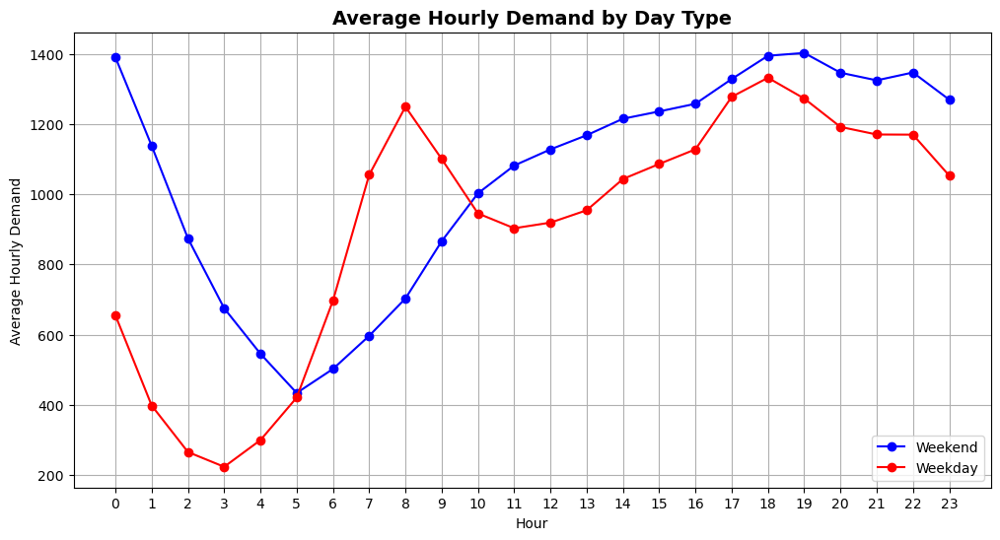

In [144]:
# Group by pickup_hour and day_type to calculate average hourly demand for Weekend and Weekday
avg_demand = hourly_demand_df.groupby(['pickup_hour', 'day_type'])['mean_hourly_demand']\
                             .mean().reset_index()

# Pivot the table so we have separate columns for Weekend and Weekday
avg_demand_pivot = avg_demand.pivot(index='pickup_hour', columns='day_type', 
                                    values='mean_hourly_demand')

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(avg_demand_pivot.index, avg_demand_pivot['Weekend'], 
         marker='o', label='Weekend', color='blue')
plt.plot(avg_demand_pivot.index, avg_demand_pivot['Weekday'], 
         marker='o', label='Weekday', color='red')

# Add labels and title
plt.xlabel('Hour')
plt.ylabel('Average Hourly Demand')
plt.title('Average Hourly Demand by Day Type', weight='bold', fontsize=14)
plt.xticks(range(0, 24))
plt.legend()
plt.grid(True)

# Save and display the plot
file_name = 'hourly_demand_by_day_type.png'
file_path = os.path.join(plot_path, file_name)
plt.savefig(file_path, dpi=300, bbox_inches='tight')

plt.show()

### Compare Hourly Pickup Demand Among Day of Week:

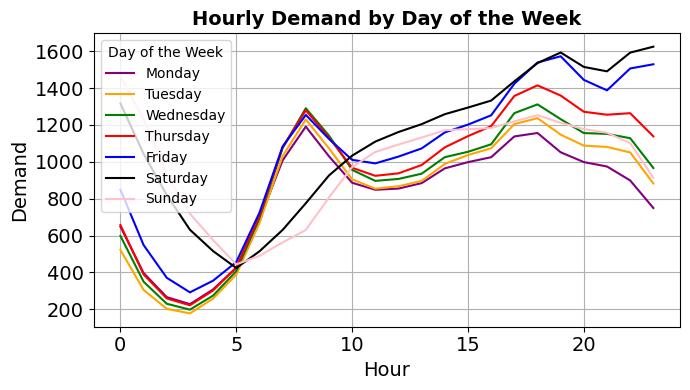

In [59]:
days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Sort the DataFrame by day_of_week and pickup_hour
hourly_demand_among_day_of_week_df.sort_values(by=['pickup_hour'], inplace=True)

# Create the plot
plt.figure(figsize=(7, 4))

# Define colors for each day of the week
colors = {
    'Monday': 'purple',
    'Tuesday': 'orange',
    'Wednesday': 'green',
    'Thursday': 'red',
    'Friday': 'blue',
    'Saturday': 'black',
    'Sunday': 'pink'
}

# Plot each day of the week
for day in days:
    day_data = hourly_demand_among_day_of_week_df[hourly_demand_among_day_of_week_df['day_of_week'] == day]
    sns.lineplot(x='pickup_hour', y='day_by_hour_demand', data=day_data, label=day, color=colors[day], errorbar=None)

plt.xlabel('Hour', fontsize=14)
plt.ylabel('Demand', fontsize=14)
plt.title('Hourly Demand by Day of the Week', weight='bold', fontsize=14)
plt.legend(title='Day of the Week')
plt.grid(True)

# Adjust the size of the tick labels on both axes
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Save and display the plot
plt.tight_layout()

file_name = 'hourly_demand_among_day_of_week.png'
file_path = os.path.join(plot_path, file_name)
plt.savefig(file_path, dpi=300, bbox_inches='tight')

plt.show()

### Compare Daily Pickup Demand by Location ID:

In [13]:
zone_gdf = gpd.GeoDataFrame(zone_gdf, geometry='geometry')
zone_gdf = zone_gdf.drop_duplicates('location_id')
geoJSON = zone_gdf[['location_id', 'geometry']].drop_duplicates('location_id').to_json()

In [112]:
# Create map with CartoDB Positron tiles (light color background)
m = folium.Map(location=[40.73, -73.74], 
               tiles="https://{s}.basemaps.cartocdn.com/light_all/{z}/{x}/{y}{r}.png",
               attr="Map tiles by CartoDB, under CC BY 3.0. Data by OpenStreetMap, under ODbL.",
               zoom_start=10,
               zoom_control=False,
               width='100%',
               height='500px')

# Add title
title = '''
        <h3 align="left" style="font-size:16px"><b>
        Daily Pickup Demand of High Volume for Hire Vehicle in NYC</b></h3>'''
m.get_root().html.add_child(folium.Element(title))

# Create Choropleth layer
c = folium.Choropleth(
    geo_data=geoJSON,  # geoJSON 
    name='choropleth',  # plot name
    data=daily_pickup_demand_by_location_df,  # data source
    columns=['location_id', 'daily_demand'],  # required columns
    key_on='properties.location_id',  # geoJSON property key
    bins=9,
    fill_color='RdPu',  # color scheme
    line_opacity=0.3,
    nan_fill_color='Lightgreen',
    legend_name='Daily Pickup Demand of High Volume for Hire Vehicle in NYC'
)

# Add layer to map
c.add_to(m)

In [113]:
daily_pickup_demand_by_location_df.head()

,location_id,daily_demand
0,138,10761.804348
1,132,10112.038043
2,79,7616.304348
3,61,7402.119565
4,230,6427.972826


This shows the locations for highest pickup daily demand are in location 138, 132, 79, 61, and 230. We will label them in the map.

In [114]:
# Filter the GeoDataFrame for specific location_ids
selected_locations = [138, 132, 79, 61, 230]
filtered_zone_gdf = zone_gdf.loc[zone_gdf['location_id'].isin(selected_locations)].copy()

# Calculate centroids if not already calculated
filtered_zone_gdf.loc[:, 'centroid'] = filtered_zone_gdf['geometry'].apply(lambda x: (x.centroid.y, x.centroid.x))

# Add markers to the map for the selected locations
for _, row in filtered_zone_gdf.iterrows():
    location_id = row['location_id']
    zone_name = row['zone']
    coord = row['centroid']
    folium.Marker(location=coord, popup=f"{zone_name} (ID: {location_id})").add_to(m)

# Save and display the map
file_name = 'daily_pickup_demand_by_location_id.html'
file_path = os.path.join(plot_path, file_name)
m.save(file_path)

m

From the above plot, we could know that the daily demand varies by different boroughs. So we will look at the daily demand by boroughs later.

In [115]:
filtered_zone_gdf

,location_id,service_zone,Shape_Leng,Shape_Area,zone,borough,geometry,centroid
60,61,Boro Zone,0.117311,0.000511,Crown Heights North,Brooklyn,"POLYGON ((-73.92916 40.68344, -73.92901 40.682...","(40.674469418266476, -73.93928705867958)"
78,79,Yellow Zone,0.042625,0.000108,East Village,Manhattan,"POLYGON ((-73.98378 40.72154, -73.98382 40.721...","(40.727620195909545, -73.9859374568246)"
131,132,Airports,0.245479,0.002038,JFK Airport,Queens,"MULTIPOLYGON (((-73.82503 40.66358, -73.82486 ...","(40.64698489239517, -73.78653298334972)"
137,138,Airports,0.107467,0.000537,LaGuardia Airport,Queens,"MULTIPOLYGON (((-73.87125 40.78604, -73.86978 ...","(40.77437570593249, -73.87362864289108)"
229,230,Yellow Zone,0.031028,0.000056,Times Sq/Theatre District,Manhattan,"POLYGON ((-73.98362 40.75552, -73.98412 40.754...","(40.75981761719184, -73.98419648907571)"


By the previous analysis, we know the building class with highest daily demand is B, A, C, S, and D. Next we will look at the building classes for each `zone` (the zone with highest pickup demand) in the previous dataframe:

In [116]:
highest_daily_demand_location_zones = ['LaGuardia Airport', 
                                       'Crown Heights North', 
                                       'East Village', 
                                       'JFK Airport', 
                                       'Times Sq/Theatre District']
highest_daily_demand_building_class = ['B', 'A', 'C', 'S', 'D']

for sub_class in highest_daily_demand_building_class:
    sub_df = pluto_df[pluto_df['building_class'] == sub_class]
    zone_borough = sub_df[['zone', 'borough']].drop_duplicates()

    zones = zone_borough['zone'].unique()
    boroughs = zone_borough['borough'].unique()

    print('Building Class', sub_class+':')
    print('Boroughs:', boroughs)
    print('Zones:')
    for zone in highest_daily_demand_location_zones:
        if (zone in zones) == True:
            print(zone, 'yes')
    print('\n')

Building Class B:
Boroughs: ['Staten Island' 'Brooklyn' 'Queens' 'Manhattan' 'Bronx']
Zones:
Crown Heights North yes
East Village yes


Building Class A:
Boroughs: ['Staten Island' 'Brooklyn' 'Queens' 'Manhattan' 'Bronx']
Zones:
Crown Heights North yes
East Village yes


Building Class C:
Boroughs: ['Brooklyn' 'Staten Island' 'Queens' 'Manhattan' 'Bronx']
Zones:
Crown Heights North yes
East Village yes
Times Sq/Theatre District yes


Building Class S:
Boroughs: ['Brooklyn' 'Staten Island' 'Manhattan' 'Queens' 'Bronx']
Zones:
Crown Heights North yes
East Village yes
Times Sq/Theatre District yes


Building Class D:
Boroughs: ['Brooklyn' 'Manhattan' 'Queens' 'Bronx' 'Staten Island']
Zones:
Crown Heights North yes
East Village yes
Times Sq/Theatre District yes




### Compare Daily Dropoff Demand by Location ID:

In [117]:
# Create map with CartoDB Positron tiles (light color background)
m = folium.Map(location=[40.73, -73.74], 
               tiles="https://{s}.basemaps.cartocdn.com/light_all/{z}/{x}/{y}{r}.png",
               attr="Map tiles by CartoDB, under CC BY 3.0. Data by OpenStreetMap, under ODbL.",
               zoom_start=10,
               zoom_control=False,
               width='100%',
               height='500px')

# Add title
title = '''
        <h3 align="left" style="font-size:16px"><b>
        Daily Dropoff Demand of High Volume for Hire Vehicle in NYC</b></h3>'''
m.get_root().html.add_child(folium.Element(title))

# Create Choropleth layer
c = folium.Choropleth(
    geo_data=geoJSON,  # geoJSON 
    name='choropleth',  # plot name
    data=daily_dropoff_demand_by_location_df,  # data source
    columns=['location_id', 'daily_demand'],  # required columns
    key_on='properties.location_id',  # geoJSON property key
    bins=9,
    fill_color='RdPu',  # color scheme
    line_opacity=0.3,
    nan_fill_color='Lightgreen',
    legend_name='Daily Dropoff Demand of High Volume for Hire Vehicle in NYC'
)

# Add layer to map
c.add_to(m)

In [118]:
daily_dropoff_demand_by_location_df.head()

,location_id,daily_demand
0,132,15080.815217
1,138,13835.298913
2,61,7743.902174
3,68,6500.304348
4,79,6363.163043


This shows the locations for highest dropoff daily demand are in location 132, 138, 61, 68, and 79. We will label them in the map.

In [119]:
# Filter the GeoDataFrame for specific location_ids
selected_locations = [132, 138, 61, 68, 79]
filtered_zone_gdf = zone_gdf.loc[zone_gdf['location_id'].isin(selected_locations)].copy()

# Calculate centroids if not already calculated
filtered_zone_gdf.loc[:, 'centroid'] = filtered_zone_gdf['geometry'].apply(lambda x: (x.centroid.y, x.centroid.x))

# Add markers to the map for the selected locations
for _, row in filtered_zone_gdf.iterrows():
    location_id = row['location_id']
    zone_name = row['zone']
    coord = row['centroid']
    folium.Marker(location=coord, popup=f"{zone_name} (ID: {location_id})").add_to(m)

# Save and display the map
file_name = 'daily_dropoff_demand_by_location_id.html'
file_path = os.path.join(plot_path, file_name)
m.save(file_path)

m

In [120]:
filtered_zone_gdf

,location_id,service_zone,Shape_Leng,Shape_Area,zone,borough,geometry,centroid
60,61,Boro Zone,0.117311,0.000511,Crown Heights North,Brooklyn,"POLYGON ((-73.92916 40.68344, -73.92901 40.682...","(40.674469418266476, -73.93928705867958)"
67,68,Yellow Zone,0.049337,0.000111,East Chelsea,Manhattan,"POLYGON ((-74.00202 40.74044, -74.00252 40.739...","(40.748427555065724, -73.99991742024712)"
78,79,Yellow Zone,0.042625,0.000108,East Village,Manhattan,"POLYGON ((-73.98378 40.72154, -73.98382 40.721...","(40.727620195909545, -73.9859374568246)"
131,132,Airports,0.245479,0.002038,JFK Airport,Queens,"MULTIPOLYGON (((-73.82503 40.66358, -73.82486 ...","(40.64698489239517, -73.78653298334972)"
137,138,Airports,0.107467,0.000537,LaGuardia Airport,Queens,"MULTIPOLYGON (((-73.87125 40.78604, -73.86978 ...","(40.77437570593249, -73.87362864289108)"


By the previous analysis, we know the building class with highest daily demand is B, A, C, S, and D. Next we will look at the building classes for each `zone` (the zone with highest dropoff demand) in the previous dataframe:

In [121]:
highest_daily_demand_location_zones = ['LaGuardia Airport', 
                                       'Crown Heights North', 
                                       'East Village', 
                                       'JFK Airport', 
                                       'East Chelsea']
highest_daily_demand_building_class = ['B', 'A', 'C', 'S', 'D']

for sub_class in highest_daily_demand_building_class:
    sub_df = pluto_df[pluto_df['building_class'] == sub_class]
    zone_borough = sub_df[['zone', 'borough']].drop_duplicates()

    zones = zone_borough['zone'].unique()
    boroughs = zone_borough['borough'].unique()

    print('Building Class', sub_class+':')
    print('Boroughs:', boroughs)
    print('Zones:')
    for zone in highest_daily_demand_location_zones:
        if (zone in zones) == True:
            print(zone, 'yes')
    print('\n')

Building Class B:
Boroughs: ['Staten Island' 'Brooklyn' 'Queens' 'Manhattan' 'Bronx']
Zones:
Crown Heights North yes
East Village yes
East Chelsea yes


Building Class A:
Boroughs: ['Staten Island' 'Brooklyn' 'Queens' 'Manhattan' 'Bronx']
Zones:
Crown Heights North yes
East Village yes
East Chelsea yes


Building Class C:
Boroughs: ['Brooklyn' 'Staten Island' 'Queens' 'Manhattan' 'Bronx']
Zones:
Crown Heights North yes
East Village yes
East Chelsea yes


Building Class S:
Boroughs: ['Brooklyn' 'Staten Island' 'Manhattan' 'Queens' 'Bronx']
Zones:
Crown Heights North yes
East Village yes
East Chelsea yes


Building Class D:
Boroughs: ['Brooklyn' 'Manhattan' 'Queens' 'Bronx' 'Staten Island']
Zones:
Crown Heights North yes
East Village yes
East Chelsea yes




### Compare Daily Demand by Building Class:

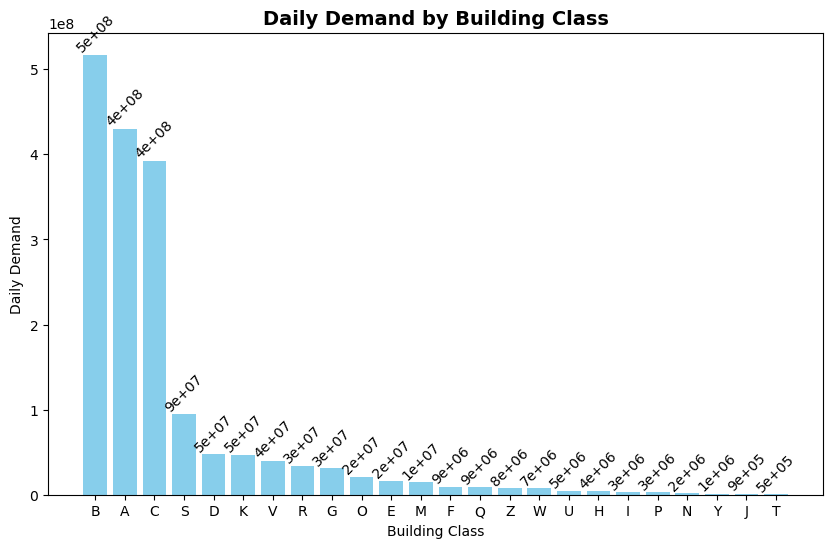

In [122]:
plt.figure(figsize=(10, 6))
bars = plt.bar(demand_by_building_class_df['building_class'], demand_by_building_class_df['daily_demand'], color='skyblue')

# Add labels to each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f'{yval:.0e}', ha='center', va='bottom', rotation=45)

plt.title('Daily Demand by Building Class', weight='bold', fontsize=14)
plt.xlabel('Building Class')
plt.ylabel('Daily Demand')

# Save and display the plot
file_name = 'daily_demand_by_building_class.png'
file_path = os.path.join(plot_path, file_name)
plt.savefig(file_path, dpi=300, bbox_inches='tight')

plt.show()

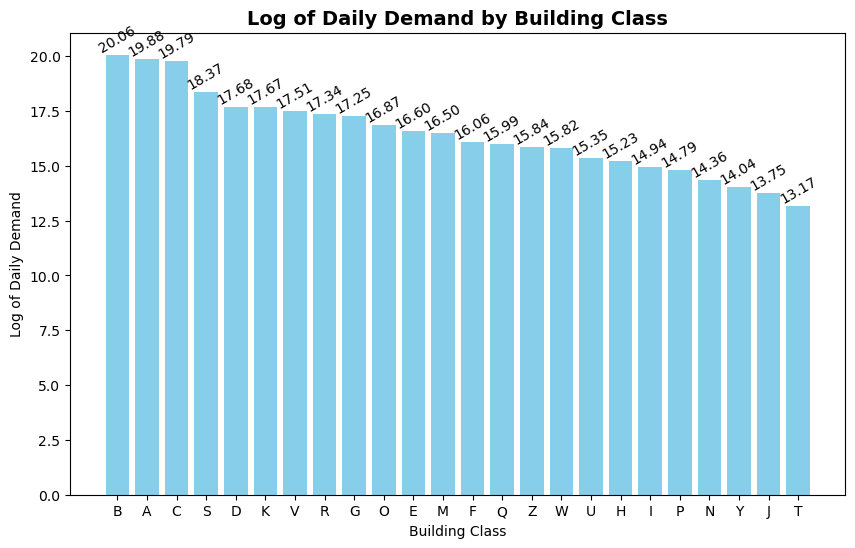

In [123]:
# Apply log transform to daily demand
demand_by_building_class_df['log_daily_demand'] = np.log1p(demand_by_building_class_df['daily_demand'])

# Plot
plt.figure(figsize=(10, 6))
bars = plt.bar(demand_by_building_class_df['building_class'], demand_by_building_class_df['log_daily_demand'], color='skyblue')

# Add the logarithmic value to each column
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f'{yval:.2f}', ha='center', va='bottom', rotation=30)

plt.title('Log of Daily Demand by Building Class', weight='bold', fontsize=14)
plt.xlabel('Building Class')
plt.ylabel('Log of Daily Demand')

# Save and display the plot
file_name = 'log_daily_demand_by_building_class.png'
file_path = os.path.join(plot_path, file_name)
plt.savefig(file_path, dpi=300, bbox_inches='tight')

plt.show()

### Daily Pickup Demand by Different Boroughs:

#### Plots:

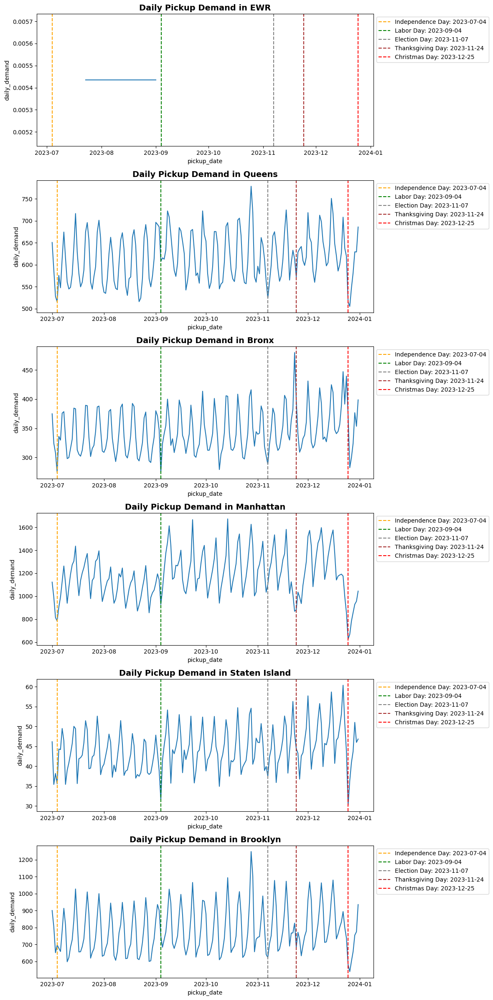

In [48]:
# Get all location IDs for each borough
borough_id = {}
for borough in zone_gdf['borough'].unique():
    borough_id[borough] = zone_gdf[zone_gdf['borough'] == borough]['location_id'].unique().tolist()

# Placeholder for how your DataFrame is structured
daily_demand_by_borough = {}

# Create a sample dataframe for each borough
for borough, ids in borough_id.items():
    daily_demand_by_borough[borough] = daily_demand.filter(daily_demand['PULocationID'].isin(ids)).toPandas()

# Initialize the plot
idx = 0
fig, ax = plt.subplots(len(borough_id.keys()), figsize=(14, 24))

# Define holiday colors
holiday_colors = {
    'Independence Day': 'orange',
    'Labor Day': 'green',
    'Election Day': 'gray',
    'Thanksgiving Day': 'brown',
    'Christmas Day': 'red'
}

# Define holidays
holidays = {
    'Independence Day': datetime.datetime(2023, 7, 4),
    'Labor Day': datetime.datetime(2023, 9, 4),
    'Election Day': datetime.datetime(2023, 11, 7),
    'Thanksgiving Day': datetime.datetime(2023, 11, 24),
    'Christmas Day': datetime.datetime(2023, 12, 25)
}

# Find top 3 days with highest daily demand for each borough
top_days_by_borough = {}

for borough, df in daily_demand_by_borough.items():
    # Sum up the pickup counts grouped by date
    df = df.groupby('pickup_date').agg({'daily_demand': 'sum'}).reset_index()
    
    # Find the top 3 days with highest daily demand
    top_days = df.sort_values(by='daily_demand', ascending=False).head(3)
    top_days_by_borough[borough] = top_days

    # Create line plot
    sns.lineplot(x='pickup_date', y='daily_demand', data=df, ax=ax[idx])

    # Highlight specific public holidays with vertical lines
    for holiday_name, holiday_date in holidays.items():
        ax[idx].axvline(holiday_date, color=holiday_colors[holiday_name], linestyle='--', label=f'{holiday_name}: {holiday_date.date()}')

    # Add title for each subplot
    ax[idx].set_title(f'Daily Pickup Demand in {borough}', weight='bold', fontsize=14)
    
    # Adjust legend
    ax[idx].legend(loc='upper left', bbox_to_anchor=(1, 1))  # Position legend outside the plot area

    idx += 1

# Save and display the plot
plt.tight_layout(rect=[0, 0, 0.85, 1]) 

file_name = 'daily_demand_by_borough.png'
file_path = os.path.join(plot_path, file_name)
plt.savefig(file_path, dpi=300, bbox_inches='tight')

plt.show()

#### Find top 3 days with highest daily demand for each borough:

In [49]:
for borough, top_days in top_days_by_borough.items():
    print(f"Top 3 days with highest daily demand in {borough}:")
    print(top_days)
    print("\n")

Top 3 days with highest daily demand in EWR:
  pickup_date  daily_demand
0  2023-07-23      0.005435
1  2023-09-01      0.005435


Top 3 days with highest daily demand in Queens:
    pickup_date  daily_demand
119  2023-10-28    778.423913
167  2023-12-15    750.853261
140  2023-11-18    724.554348


Top 3 days with highest daily demand in Bronx:
    pickup_date  daily_demand
145  2023-11-23    480.005435
174  2023-12-22    447.250000
176  2023-12-24    439.668478


Top 3 days with highest daily demand in Manhattan:
    pickup_date  daily_demand
105  2023-10-14   1672.603261
84   2023-09-23   1665.760870
119  2023-10-28   1625.592391


Top 3 days with highest daily demand in Staten Island:
    pickup_date  daily_demand
174  2023-12-22     60.369565
167  2023-12-15     58.673913
153  2023-12-01     57.695652


Top 3 days with highest daily demand in Brooklyn:
    pickup_date  daily_demand
119  2023-10-28   1248.592391
120  2023-10-29   1104.271739
105  2023-10-14   1094.391304




### Daily Pickup Demand:

#### Plot:

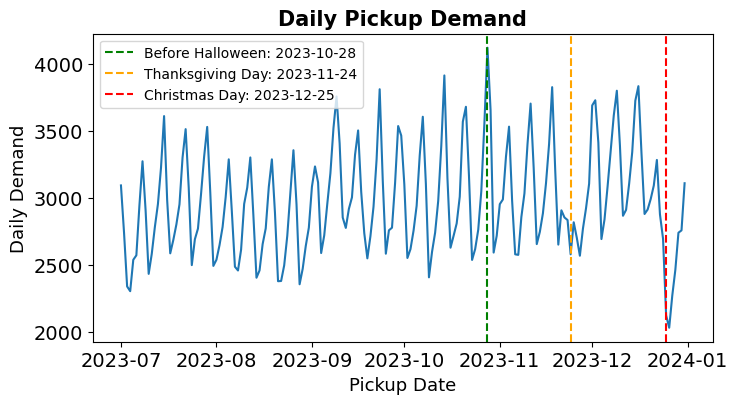

In [52]:
# Define holiday colors
holiday_colors = {
    'Before Halloween': 'green',
    'Thanksgiving Day': 'orange',
    'Christmas Day': 'red'
}

# Define holidays
holidays = {
    'Before Halloween': datetime.datetime(2023, 10, 28),
    'Thanksgiving Day': datetime.datetime(2023, 11, 24),
    'Christmas Day': datetime.datetime(2023, 12, 25)
}

# Combine data for all boroughs into a single DataFrame
combined_df = pd.concat(daily_demand_by_borough.values())

# Sum up the pickup counts grouped by date across all boroughs
combined_df = combined_df.groupby('pickup_date').agg({'daily_demand': 'sum'}).reset_index()

# Initialize the plot
plt.figure(figsize=(8, 4))

# Create line plot
sns.lineplot(x='pickup_date', y='daily_demand', data=combined_df)

# Highlight specific public holidays with vertical lines
for holiday_name, holiday_date in holidays.items():
    plt.axvline(holiday_date, color=holiday_colors[holiday_name], linestyle='--', label=f'{holiday_name}: {holiday_date.date()}')

# Add title and adjust legend
plt.title('Daily Pickup Demand', weight='bold', fontsize=15)
plt.legend()  # Position legend outside the plot area 

# Adjust the size of the axis labels
plt.xlabel('Pickup Date', fontsize=13)
plt.ylabel('Daily Demand', fontsize=13)

# Adjust the size of the tick labels on both axes
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Save and display the plot
file_name = 'daily_demand.png'
file_path = os.path.join(plot_path, file_name)
plt.savefig(file_path, dpi=300, bbox_inches='tight')

plt.show()

#### Find top 3 days with highest daily demand:

In [75]:
# Find the top 3 days with the highest daily demand
top_3_days = combined_df.sort_values(by='daily_demand', ascending=False).head(3)

# Output the result
print("Top 3 days with the highest daily demand:")
print(top_3_days)

Top 3 days with the highest daily demand:
    pickup_date  daily_demand
119  2023-10-28   4123.298913
105  2023-10-14   3916.304348
168  2023-12-16   3836.179348


### Compare Monthly Demand:

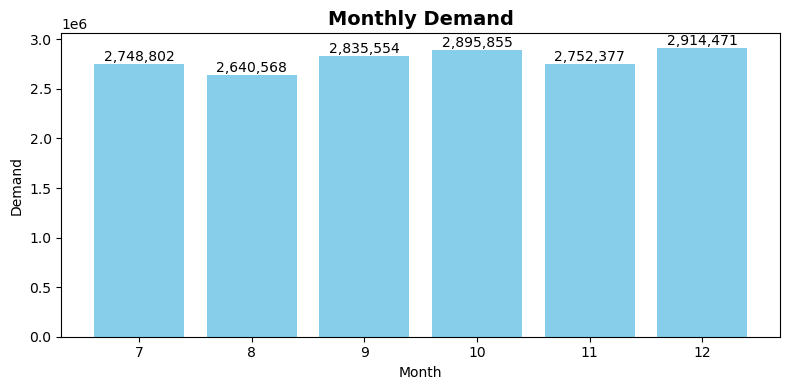

In [5]:
# Create the plot
plt.figure(figsize=(8, 4))
bars = plt.bar(monthly_demand_df['month'], monthly_demand_df['monthly_demand'], color='skyblue')

# Annotate each bar with the corresponding demand value
for bar in bars:
    yval = bar.get_height()
    formatted_yval = f"{int(yval):,}"  # Format the number with commas
    plt.text(bar.get_x() + bar.get_width()/2, yval, formatted_yval, va='bottom', ha='center')

plt.xlabel('Month', fontsize=10)
plt.ylabel('Demand', fontsize=10)
plt.title('Monthly Demand', weight='bold', fontsize=14)
plt.xticks()

# Save and display the plot
plt.tight_layout()

file_name = 'monthly_pickup_demand.png'
file_path = os.path.join(plot_path, file_name)
plt.savefig(file_path, dpi=300, bbox_inches='tight')

plt.show()

# Plots Related to Revenue:

### Compare the Peak of Revenue for Weekday and Weekend:

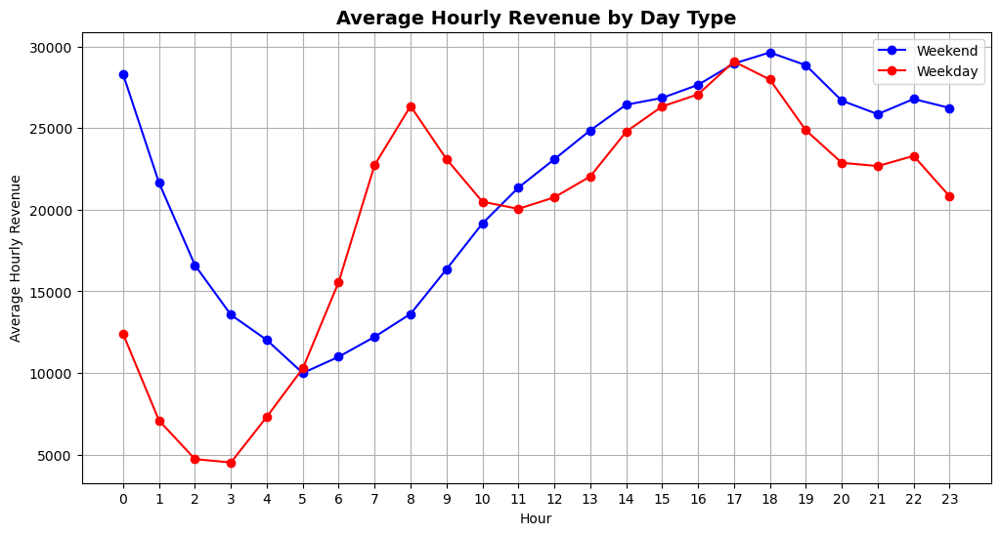

In [145]:
# Group by pickup_hour and day_type to calculate average hourly demand for Weekend and Weekday
avg_revenue = hourly_revenue_df.groupby(['pickup_hour', 'day_type'])['mean_hourly_revenue']\
                             .mean().reset_index()

# Pivot the table so we have separate columns for Weekend and Weekday
avg_revenue_pivot = avg_revenue.pivot(index='pickup_hour', columns='day_type', 
                                      values='mean_hourly_revenue')

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(avg_revenue_pivot.index, avg_revenue_pivot['Weekend'], 
         marker='o', label='Weekend', color='blue')
plt.plot(avg_revenue_pivot.index, avg_revenue_pivot['Weekday'], 
         marker='o', label='Weekday', color='red')

# Add labels and title
plt.xlabel('Hour')
plt.ylabel('Average Hourly Revenue')
plt.title('Average Hourly Revenue by Day Type', weight='bold', fontsize=14)
plt.xticks(range(0, 24))
plt.legend()
plt.grid(True)

# Save and display the plot
file_name = 'hourly_revenue_by_day_type.png'
file_path = os.path.join(plot_path, file_name)
plt.savefig(file_path, dpi=300, bbox_inches='tight')

plt.show()

### Compare Hourly Revenue Among Day of Week:

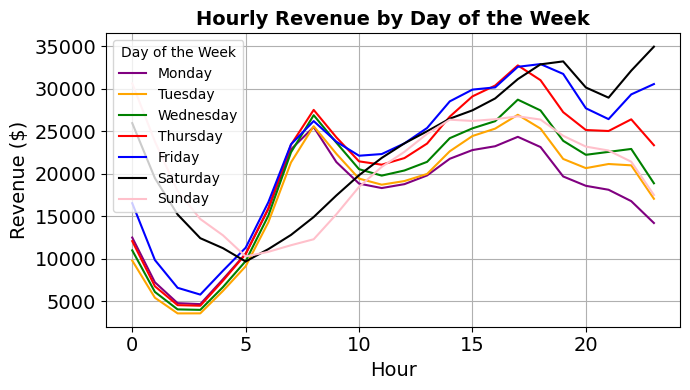

In [60]:
days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Sort the DataFrame by day_of_week and pickup_hour
hourly_revenue_among_day_of_week_df.sort_values(by=['pickup_hour'], inplace=True)

# Create the plot
plt.figure(figsize=(7, 4))

# Define colors for each day of the week
colors = {
    'Monday': 'purple',
    'Tuesday': 'orange',
    'Wednesday': 'green',
    'Thursday': 'red',
    'Friday': 'blue',
    'Saturday': 'black',
    'Sunday': 'pink'
}

# Plot each day of the week
for day in days:
    day_data = hourly_revenue_among_day_of_week_df[hourly_revenue_among_day_of_week_df['day_of_week'] == day]
    sns.lineplot(x='pickup_hour', y='day_by_hour_revenue', data=day_data, label=day, color=colors[day], errorbar=None)

plt.xlabel('Hour', fontsize=14)
plt.ylabel('Revenue ($)', fontsize=14)
plt.title('Hourly Revenue by Day of the Week', weight='bold', fontsize=14)
plt.legend(title='Day of the Week')
plt.grid(True)

# Adjust the size of the tick labels on both axes
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Save and display the plot
plt.tight_layout()

file_name = 'hourly_revenue_among_day_of_week.png'
file_path = os.path.join(plot_path, file_name)
plt.savefig(file_path, dpi=300, bbox_inches='tight')

plt.show()

### Compare Daily Revenue by Location ID:

In [14]:
# Create map with CartoDB Positron tiles (light color background)
m = folium.Map(location=[40.73, -73.74], 
               tiles="https://{s}.basemaps.cartocdn.com/light_all/{z}/{x}/{y}{r}.png",
               attr="Map tiles by CartoDB, under CC BY 3.0. Data by OpenStreetMap, under ODbL.",
               zoom_start=10,
               zoom_control=False,
               width='100%',
               height='500px')

# Add title
title = '''
        <h3 align="left" style="font-size:16px"><b>
        Daily Revenue of High Volume for Hire Vehicle in NYC</b></h3>'''
m.get_root().html.add_child(folium.Element(title))

# Create Choropleth layer
c = folium.Choropleth(
    geo_data=geoJSON,  # geoJSON 
    name='choropleth',  # plot name
    data=daily_revenue_by_location_df,  # data source
    columns=['location_id', 'daily_revenue'],  # required columns
    key_on='properties.location_id',  # geoJSON property key
    bins=9,
    fill_color='RdPu',  # color scheme
    line_opacity=0.3,
    nan_fill_color='Lightgreen',
    legend_name='Daily Revenue of High Volume for Hire Vehicle in NYC'
)

# Add layer to map
c.add_to(m)

In [15]:
daily_revenue_by_location_df.head()

,location_id,daily_revenue
0,132,490265.603750
1,138,400708.996413
2,230,182360.321467
3,161,163863.122609
4,79,156364.447935


This shows the locations for highest daily revenue are in location 132, 138, 230, 161, and 79. We will label them in the map.

In [16]:
# Filter the GeoDataFrame for specific location_ids
selected_locations = [132, 138, 230, 161, 79]
filtered_zone_gdf = zone_gdf.loc[zone_gdf['location_id'].isin(selected_locations)].copy()

# Calculate centroids if not already calculated
filtered_zone_gdf.loc[:, 'centroid'] = filtered_zone_gdf['geometry'].apply(lambda x: (x.centroid.y, x.centroid.x))

# Add markers to the map for the selected locations
for _, row in filtered_zone_gdf.iterrows():
    location_id = row['location_id']
    zone_name = row['zone']
    coord = row['centroid']
    folium.Marker(location=coord, popup=f"{zone_name} (ID: {location_id})").add_to(m)

# Save and display the map
file_name = 'daily_revenue_by_location_id.html'
file_path = os.path.join(plot_path, file_name)
m.save(file_path)

m

From the above plot, we could know that the daily revenue varies by different boroughs. So we will look at the daily revenue by boroughs later.

In [17]:
filtered_zone_gdf

,location_id,service_zone,Shape_Leng,Shape_Area,zone,borough,geometry,centroid
78,79,Yellow Zone,0.042625,0.000108,East Village,Manhattan,"POLYGON ((-73.98378 40.72154, -73.98382 40.721...","(40.727620195909545, -73.9859374568246)"
131,132,Airports,0.245479,0.002038,JFK Airport,Queens,"MULTIPOLYGON (((-73.82503 40.66358, -73.82486 ...","(40.64698489239517, -73.78653298334972)"
137,138,Airports,0.107467,0.000537,LaGuardia Airport,Queens,"MULTIPOLYGON (((-73.87125 40.78604, -73.86978 ...","(40.77437570593249, -73.87362864289108)"
160,161,Yellow Zone,0.035804,0.000072,Midtown Center,Manhattan,"POLYGON ((-73.97534 40.7553, -73.97581 40.7546...","(40.758028043526274, -73.97769793122403)"
229,230,Yellow Zone,0.031028,0.000056,Times Sq/Theatre District,Manhattan,"POLYGON ((-73.98362 40.75552, -73.98412 40.754...","(40.75981761719184, -73.98419648907571)"


Thus, the futher analysis of revenue will focus on Manhattan and Queens.

By the previous analysis, we know the building class with highest daily revenue is B, A, C, S, and D. Next we will look at the building classes for each `zone` (the zone with highest daily revenue) in the previous dataframe:

In [19]:
highest_daily_revenue_location_zones = ['LaGuardia Airport', 
                                       'Midtown Center', 
                                       'East Village', 
                                       'JFK Airport', 
                                       'Times Sq/Theatre District']
highest_daily_revenue_location_class = ['B', 'A', 'C', 'S', 'D']

for sub_class in highest_daily_revenue_location_class:
    sub_df = pluto_df[pluto_df['building_class'] == sub_class]
    zone_borough = sub_df[['zone', 'borough']].drop_duplicates()

    zones = zone_borough['zone'].unique()
    boroughs = zone_borough['borough'].unique()

    print('Building Class', sub_class+':')
    print('Boroughs:', boroughs)
    print('Zones:')
    for zone in highest_daily_revenue_location_zones:
        if (zone in zones) == True:
            print(zone, 'yes')
    print('\n')

Building Class B:
Boroughs: ['Staten Island' 'Brooklyn' 'Queens' 'Manhattan' 'Bronx']
Zones:
East Village yes


Building Class A:
Boroughs: ['Staten Island' 'Brooklyn' 'Queens' 'Manhattan' 'Bronx']
Zones:
East Village yes


Building Class C:
Boroughs: ['Brooklyn' 'Staten Island' 'Queens' 'Manhattan' 'Bronx']
Zones:
Midtown Center yes
East Village yes
Times Sq/Theatre District yes


Building Class S:
Boroughs: ['Brooklyn' 'Staten Island' 'Manhattan' 'Queens' 'Bronx']
Zones:
Midtown Center yes
East Village yes
Times Sq/Theatre District yes


Building Class D:
Boroughs: ['Brooklyn' 'Manhattan' 'Queens' 'Bronx' 'Staten Island']
Zones:
Midtown Center yes
East Village yes
Times Sq/Theatre District yes




### Daily Revenue by Different Boroughs:

#### Plots:

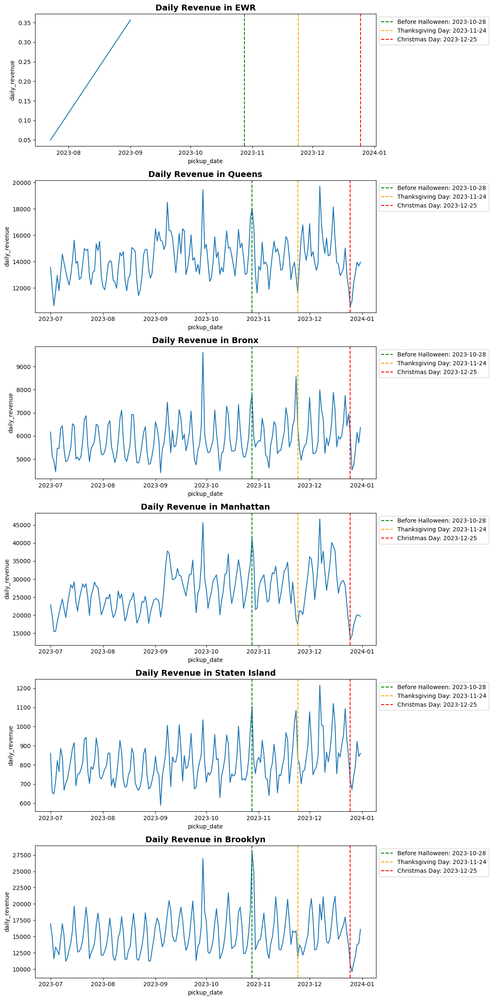

In [53]:
# Get all location IDs for each borough
borough_id = {}
for borough in zone_gdf['borough'].unique():
    borough_id[borough] = zone_gdf[zone_gdf['borough'] == borough]['location_id'].unique().tolist()

# Placeholder for how your DataFrame is structured
daily_revenue_by_borough = {}

# Create a sample dataframe for each borough
for borough, ids in borough_id.items():
    daily_revenue_by_borough[borough] = daily_revenue.filter(daily_revenue['PULocationID'].isin(ids)).toPandas()

# Initialize the plot
idx = 0
fig, ax = plt.subplots(len(borough_id.keys()), figsize=(14, 24))

# Find top 3 days with highest daily revenue for each borough
top_days_by_borough = {}

for borough, df in daily_revenue_by_borough.items():
    # Sum up the pickup counts grouped by date
    df = df.groupby('pickup_date').agg({'daily_revenue': 'sum'}).reset_index()
    
    # Find the top 3 days with highest daily revenue
    top_days = df.sort_values(by='daily_revenue', ascending=False).head(3)
    top_days_by_borough[borough] = top_days

    # Create line plot
    sns.lineplot(x='pickup_date', y='daily_revenue', data=df, ax=ax[idx])

    # Highlight specific public holidays with vertical lines
    for holiday_name, holiday_date in holidays.items():
        ax[idx].axvline(holiday_date, color=holiday_colors[holiday_name], linestyle='--', label=f'{holiday_name}: {holiday_date.date()}')

    # Add title for each subplot
    ax[idx].set_title(f'Daily Revenue in {borough}', weight='bold', fontsize=14)
    
    # Adjust legend
    ax[idx].legend(loc='upper left', bbox_to_anchor=(1, 1))  # Position legend outside the plot area

    idx += 1

# Save and display the plot
plt.tight_layout(rect=[0, 0, 0.85, 1])

file_name = 'daily_revenue_by_borough.png'
file_path = os.path.join(plot_path, file_name)
plt.savefig(file_path, dpi=300, bbox_inches='tight')

plt.show()

#### Find top 3 days with highest daily revenue for each borough:

In [54]:
for borough, top_days in top_days_by_borough.items():
    print(f"Top 3 days with highest daily revenue in {borough}:")
    print(top_days)
    print("\n")

Top 3 days with highest daily revenue in EWR:
  pickup_date  daily_revenue
1  2023-09-01       0.357011
0  2023-07-23       0.049674


Top 3 days with highest daily revenue in Queens:
    pickup_date  daily_revenue
159  2023-12-07   19715.325326
90   2023-09-29   19451.319946
69   2023-09-08   18499.662772


Top 3 days with highest daily revenue in Bronx:
    pickup_date  daily_revenue
90   2023-09-29    9603.764457
145  2023-11-23    8565.141630
159  2023-12-07    7995.784837


Top 3 days with highest daily revenue in Manhattan:
    pickup_date  daily_revenue
159  2023-12-07   46696.291848
90   2023-09-29   45663.350054
119  2023-10-28   41346.365054


Top 3 days with highest daily revenue in Staten Island:
    pickup_date  daily_revenue
159  2023-12-07    1215.367663
167  2023-12-15    1119.921630
119  2023-10-28    1104.519185


Top 3 days with highest daily revenue in Brooklyn:
    pickup_date  daily_revenue
119  2023-10-28   28044.484511
90   2023-09-29   26969.493859
120  2023-10

### Daily Revenue:

#### Plot:

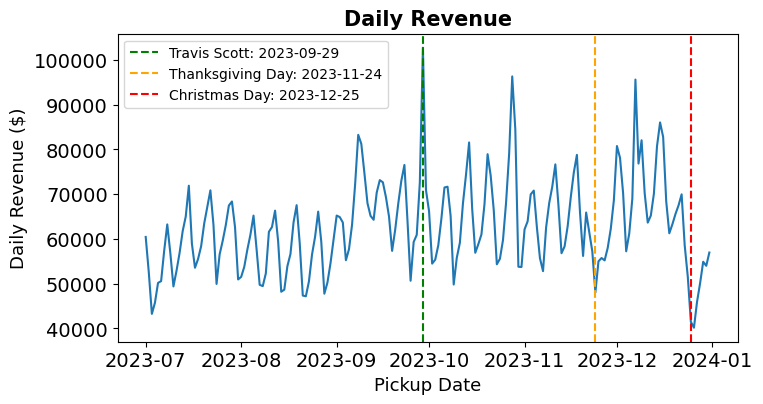

In [58]:
# Define holiday colors
holiday_colors = {
    'Travis Scott': 'green',
    'Thanksgiving Day': 'orange',
    'Christmas Day': 'red'
}

# Define holidays
holidays = {
    'Travis Scott': datetime.datetime(2023, 9, 29),
    'Thanksgiving Day': datetime.datetime(2023, 11, 24),
    'Christmas Day': datetime.datetime(2023, 12, 25)
}

# Combine data for all boroughs into a single DataFrame
combined_df = pd.concat(daily_revenue_by_borough.values())

# Sum up the pickup counts grouped by date across all boroughs
combined_df = combined_df.groupby('pickup_date').agg({'daily_revenue': 'sum'}).reset_index()

# Initialize the plot
plt.figure(figsize=(8, 4))

# Create line plot
sns.lineplot(x='pickup_date', y='daily_revenue', data=combined_df)

# Highlight specific public holidays with vertical lines
for holiday_name, holiday_date in holidays.items():
    plt.axvline(holiday_date, color=holiday_colors[holiday_name], linestyle='--', label=f'{holiday_name}: {holiday_date.date()}')

# Add title and adjust legend
plt.title('Daily Revenue', weight='bold', fontsize=15)
plt.legend()  # Position legend outside the plot area 
              # loc='upper left', bbox_to_anchor=(1, 1)

# Adjust the size of the axis labels
plt.xlabel('Pickup Date', fontsize=13)
plt.ylabel('Daily Revenue ($)', fontsize=13)

# Adjust the size of the tick labels on both axes
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Save and display the plot
file_name = 'daily_revenue.png'
file_path = os.path.join(plot_path, file_name)
plt.savefig(file_path, dpi=300, bbox_inches='tight')

plt.show()

#### Find top 3 days with highest daily revenue:

In [78]:
# Find the top 3 days with the highest daily revenue
top_3_days = combined_df.sort_values(by='daily_revenue', ascending=False).head(3)

# Output the result
print("Top 3 days with the highest daily revenue:")
print(top_3_days)

Top 3 days with the highest daily revenue:
    pickup_date  daily_revenue
90   2023-09-29  102722.653533
119  2023-10-28   96313.966793
159  2023-12-07   95607.814348


### Compare Monthly Revenue:

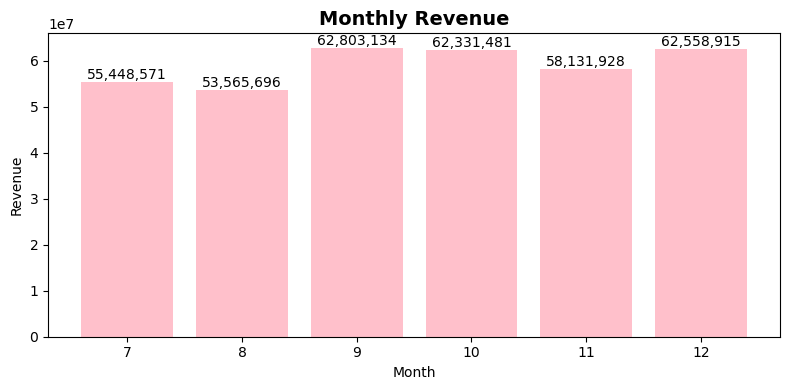

In [136]:
# Create the plot
plt.figure(figsize=(8, 4))
bars = plt.bar(monthly_revenue_df['month'], monthly_revenue_df['monthly_revenue'], color='pink')

# Annotate each bar with the corresponding revenue value
for bar in bars:
    yval = bar.get_height()
    formatted_yval = f"{int(yval):,}"  # Format the number with commas
    plt.text(bar.get_x() + bar.get_width()/2, yval, formatted_yval, va='bottom', ha='center')

plt.xlabel('Month', fontsize=10)
plt.ylabel('Revenue', fontsize=10)
plt.title('Monthly Revenue', weight='bold', fontsize=14)
plt.xticks()

# Save and display the plot
plt.tight_layout()

file_name = 'monthly_revenue.png'
file_path = os.path.join(plot_path, file_name)
plt.savefig(file_path, dpi=300, bbox_inches='tight')

plt.show()

# Plots Related Utilization Rate:

### Compare Market Share by Different Companies:

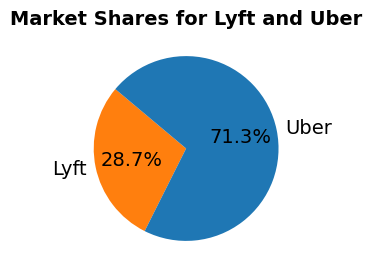

In [67]:
# Count the occurrences of each hvfhs_license_num
hvfhs_counts = hvfhv_sdf.groupBy('hvfhs_license_num').count().toPandas()

# Mapping the hvfhs_license_num to company names
hvfhs_counts['company'] = hvfhs_counts['hvfhs_license_num'].map({1: 'Lyft', 0: 'Uber'})

# Plotting the pie chart
plt.figure(figsize=(4, 3))
plt.pie(hvfhs_counts['count'], labels=hvfhs_counts['company'], 
        autopct='%1.1f%%', startangle=140, colors=['#ff7f0e', '#1f77b4'],
        textprops={'fontsize': 14})  # Adjust the fontsize here
plt.title('Market Shares for Lyft and Uber', weight='bold', fontsize=14)

# Save and display the plot
file_name = 'market_share.png'
file_path = os.path.join(plot_path, file_name)
plt.savefig(file_path, dpi=300, bbox_inches='tight')

plt.show()

### Compare Utilization Rate by Different Companies:

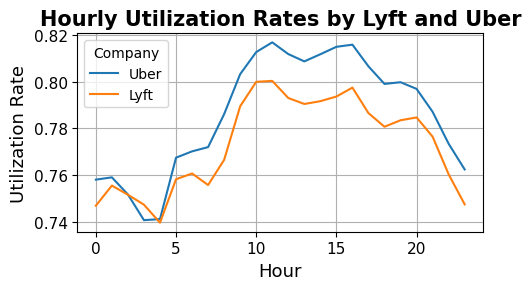

In [9]:
# Mapping the hvfhs_license_num to company names
utilization_rate_df['company'] = utilization_rate_df['hvfhs_license_num'].map({1: 'Lyft', 0: 'Uber'})

# Plotting the utilization rate over time for each company
plt.figure(figsize=(5, 3))
for company in utilization_rate_df['company'].unique():
    subset = utilization_rate_df[utilization_rate_df['company'] == company]
    plt.plot(subset['pickup_hour'], subset['avg_utilization_rate'], label=company)

# Formatting the plot
plt.title('Hourly Utilization Rates by Lyft and Uber', weight='bold', fontsize=15)
plt.xlabel('Hour', fontsize=13)
plt.ylabel('Utilization Rate', fontsize=13)
plt.legend(title='Company', labels=['Uber', 'Lyft'])  # 0 -> Uber, 1 -> Lyft
plt.tight_layout()
plt.grid(True)

# Adjust the size of the tick labels on both axes
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)

# Save and display the plot
file_name = 'utilization_rate.png'
file_path = os.path.join(plot_path, file_name)
plt.savefig(file_path, dpi=300, bbox_inches='tight')

plt.show()

# Plots Related to Weather:

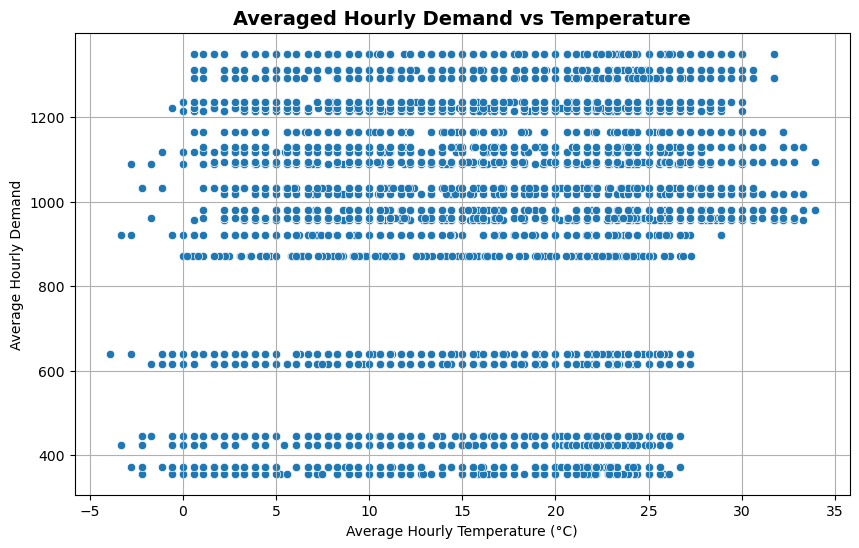

In [137]:
sorted_df = hourly_demand_by_weather_df.sort_values(by='avg_hourly_demand')

# Create the plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x='AvgHourlyTemp', y='avg_hourly_demand', data=sorted_df)
plt.xlabel('Average Hourly Temperature (°C)')
plt.ylabel('Average Hourly Demand')
plt.title('Averaged Hourly Demand vs Temperature', weight='bold', fontsize=14)
plt.grid(True)

# Save and display the plot
file_name = 'hourly_demand_by_temperature.png'
file_path = os.path.join(plot_path, file_name)
plt.savefig(file_path, dpi=300, bbox_inches='tight')

plt.show()

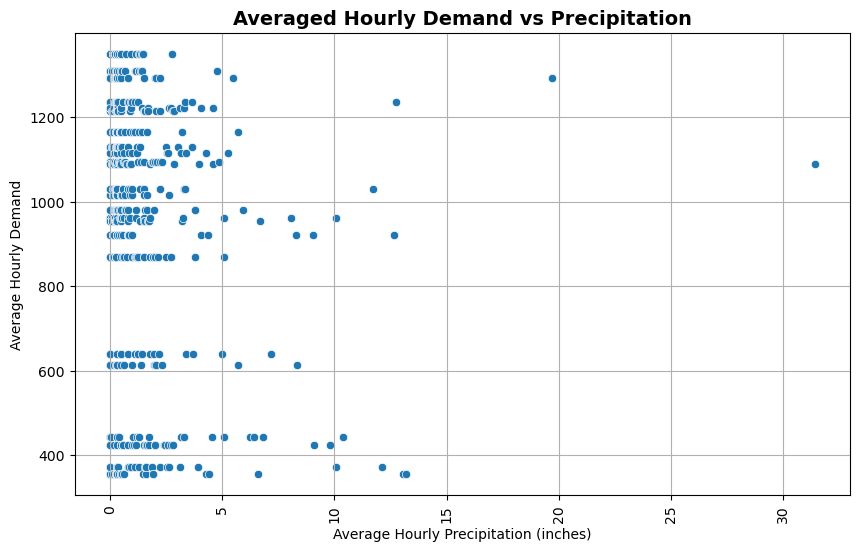

In [138]:
sorted_df = hourly_demand_by_weather_df.sort_values(by='AvgHourlyPrecipitation')

# Create the plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x='AvgHourlyPrecipitation', y='avg_hourly_demand', data=sorted_df)

plt.xlabel('Average Hourly Precipitation (inches)')
plt.ylabel('Average Hourly Demand')
plt.title('Averaged Hourly Demand vs Precipitation', weight='bold', fontsize=14)
plt.grid(True)

# Rotate x-axis tick labels
plt.xticks(rotation=90)  # Rotate x-axis labels by 45 degrees

# Save and display the plot
file_name = 'hourly_demand_by_precipitation.png'
file_path = os.path.join(plot_path, file_name)
plt.savefig(file_path, dpi=300, bbox_inches='tight')

plt.show()

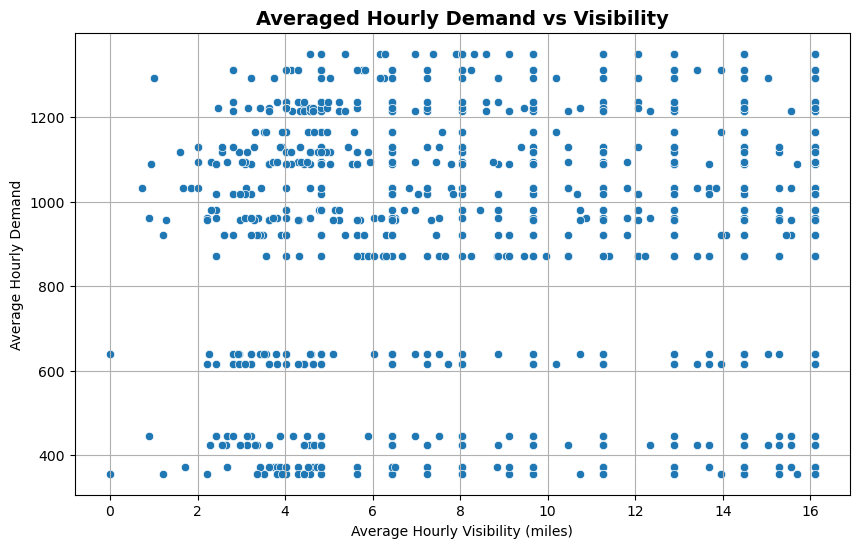

In [139]:
sorted_df = hourly_demand_by_weather_df.sort_values(by='AvgHourlyVisibility')

# Create the plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x='AvgHourlyVisibility', y='avg_hourly_demand', data=hourly_demand_by_weather_df)
plt.xlabel('Average Hourly Visibility (miles)')
plt.ylabel('Average Hourly Demand')
plt.title('Averaged Hourly Demand vs Visibility', weight='bold', fontsize=14)
plt.grid(True)

# Save and display the plot
file_name = 'hourly_demand_by_visibility.png'
file_path = os.path.join(plot_path, file_name)
plt.savefig(file_path, dpi=300, bbox_inches='tight')

plt.show()

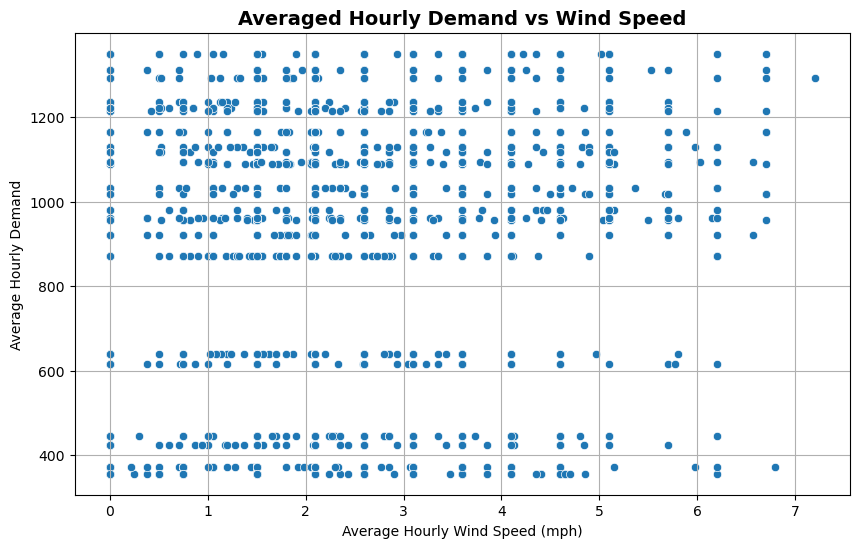

In [140]:
sorted_df = hourly_demand_by_weather_df.sort_values(by='AvgHourlyWindSpeed')

# Create the plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x='AvgHourlyWindSpeed', y='avg_hourly_demand', data=hourly_demand_by_weather_df)
plt.xlabel('Average Hourly Wind Speed (mph)')
plt.ylabel('Average Hourly Demand')
plt.title('Averaged Hourly Demand vs Wind Speed', weight='bold', fontsize=14)
plt.grid(True)

# Save and display the plot
file_name = 'hourly_demand_by_wind_speed.png'
file_path = os.path.join(plot_path, file_name)
plt.savefig(file_path, dpi=300, bbox_inches='tight')

plt.show()